## 0. 목표

오토 인코더를 활용하여 손상된 문서에서 노이즈를 제거하여 원본 문서를 복원하는 인공지능을 제작한다.

이번 실험은 주요 요소인 패딩과 증강, 학습률을 토대로 진행하고자 한다.

In [1]:
# 시각화 폰트 관련 세팅

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

try:
    plt.rcParams['font.family'] = 'Apple SD Gothic Neo'
except:
    try:
        plt.rcParams['font.family'] = 'NanumGothic'
    except:
        plt.rcParams['font.family'] = 'AppleGothic'

plt.rcParams['axes.unicode_minus'] = False
fm._load_fontmanager(try_read_cache=False)

Matplotlib is building the font cache; this may take a moment.


## 1. 데이터 확인

### 데이터 구성 확인

In [2]:
import torch
import glob

NOISED_PATHS = sorted(glob.glob("./train/train/*.png"))
CLEANED_PATHS = sorted(glob.glob("./train/train_cleaned/*.png"))
TEST_PATHS = sorted(glob.glob("./test/*.png"))

SAMPLE_NOISED_PATH = "./train/train/2.png"
SAMPLE_CLEANED_PATH = "./train/train_cleaned/2.png"

print("[파일 개수]")
print(f"· train: {len(NOISED_PATHS)}개")
print(f"· train_cleaned: {len(CLEANED_PATHS)}개")
print(f"· test: {len(TEST_PATHS)}개")

[파일 개수]
· train: 144개
· train_cleaned: 144개
· test: 72개


학습 데이터가 144개로 적은 편이다.

### 데이터 오류치 확인

In [3]:
import os

# 파일 이름만 불러오기
set_noised = set(os.listdir("./train/train"))
set_cleaned = set(os.listdir("./train/train_cleaned"))
set_test = set(os.listdir("./test"))

# 매칭되지 않는 데이터 확인
print(f"· train 폴더에만 있는 파일: {len(set_noised - set_cleaned)}개")
print(f"· train_cleaned 폴더에만 있는 파일: {len(set_cleaned - set_noised)}개")

# 학습 데이터와 겹치는 테스트 데이터 확인
print(f"· 학습-테스트 겹치는 파일: {len(set_noised & set_test)}개")

· train 폴더에만 있는 파일: 0개
· train_cleaned 폴더에만 있는 파일: 0개
· 학습-테스트 겹치는 파일: 0개


기초적인 데이터 오류는 없다.

### 샘플 데이터 확인

In [4]:
# 데이터 확인
import torchvision

sample = torchvision.io.read_image(SAMPLE_NOISED_PATH)
print(f"· 클래스: {type(sample)}\n· 데이터 타입: {sample.dtype}\n· 사이즈: {sample.shape}")

· 클래스: <class 'torch.Tensor'>
· 데이터 타입: torch.uint8
· 사이즈: torch.Size([1, 258, 540])


- uint8 형식으로, 0부터 255까지의 값을 순환하는 구조이다.

- 사이즈는 C, H, W 형태이다.

- 텐서 타입이다.

In [5]:
# 샘플 이미지 랜덤 출력
import random

rand_idx = random.randint(0, len(NOISED_PATHS))
rand_train = NOISED_PATHS[rand_idx]
rand_train_cleaned = CLEANED_PATHS[rand_idx]

rand_train = torchvision.io.read_image(rand_train)[0]
rand_train_cleaned = torchvision.io.read_image(rand_train_cleaned)[0]

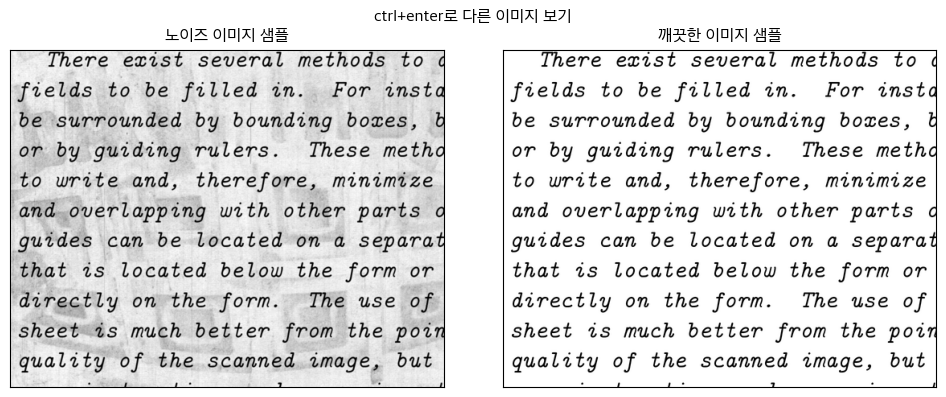

In [6]:
# 축 숫자 표기 제거 함수 생성
def remove_ticks(columns=2):
    for num in range(columns):
        axes[num].set_xticks([])
        axes[num].set_yticks([])

# 샘플 이미지 출력
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
remove_ticks()

axes[0].imshow(rand_train, cmap="gray")
axes[1].imshow(rand_train_cleaned, cmap="gray")

fig.suptitle("ctrl+enter로 다른 이미지 보기")
axes[0].set_title("노이즈 이미지 샘플")
axes[1].set_title("깨끗한 이미지 샘플")

plt.tight_layout()
plt.show()

깨끗한 이미지 위에 전체적으로 노이즈를 덧씌운 형태이다.

즉, 현 데이터셋에서 노이즈를 입힌다는 것은 밝기값을 낮춘다는 것이다.

그림마다 크기가 차이가 나는 것이 확인되므로, 구성 점검이 필요하다.

### 사이즈 구성 확인

In [7]:
# 학습 이미지 사이즈 구성 파악
size_list = []

for file in NOISED_PATHS:
    file = torchvision.io.read_image(file)
    size_list.append(file.shape)

print("[학습 데이터 사이즈 구성]")
for size in set(size_list):
    print(f"· (H {size[1]}, W {size[2]}): {size_list.count(size)}개") 

[학습 데이터 사이즈 구성]
· (H 258, W 540): 48개
· (H 420, W 540): 96개


In [8]:
# 테스트 이미지 사이즈 구성 파악
size_list = []

for file in TEST_PATHS:
    file = torchvision.io.read_image(file)
    size_list.append(file.shape)

print("[테스트 데이터 사이즈 구성]")
for size in set(size_list):
    print(f"· (H {size[1]}, W {size[2]}): {size_list.count(size)}개") 

[테스트 데이터 사이즈 구성]
· (H 258, W 540): 24개
· (H 420, W 540): 48개


사이즈는 두 종류로, 세로 사이즈가 258과 420으로 나뉜다.

전처리 과정에서 사이즈를 통일해야 한다.

### 오류치 확인 1. 노이즈 이미지가 깨끗한 이미지보다 밝은 경우

In [9]:
sample_noised = torchvision.io.read_image(SAMPLE_NOISED_PATH)[0]
sample_cleaned = torchvision.io.read_image(SAMPLE_CLEANED_PATH)[0]

# 노이즈 이미지 중 깨끗한 이미지보다 밝은 픽셀 확인
err_bright = (sample_noised > sample_cleaned)
print(f"깨끗한 이미지보다 밝은 노이즈 이미지 픽셀 개수: {err_bright.sum().item()}개")

깨끗한 이미지보다 밝은 노이즈 이미지 픽셀 개수: 11930개


육안으로 봤을 때는 노이즈 이미지가 전체적으로 어두울 것으로 짐작되었으므로, 

오류치 여부를 확인하기 위해 실제 이미지를 출력해본다.

· 좌표: (37,477)
· 노이즈 이미지 픽셀 값: 126
· 깨끗한 이미지 픽셀 값: 107


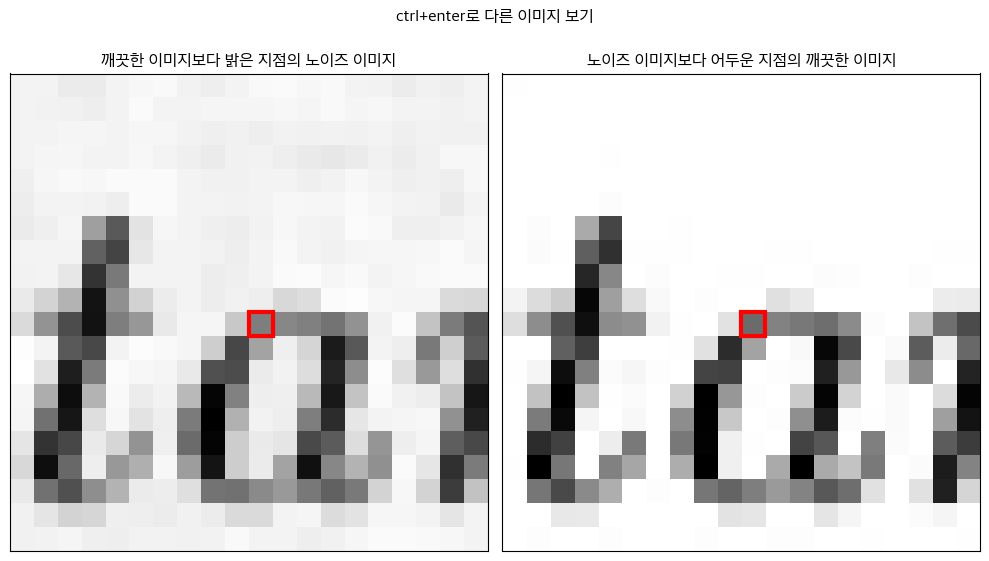

In [10]:
# 실제 확인
err_pixel_list = torch.nonzero(err_bright)

rand_idx = random.randint(0, len(err_pixel_list))

x, y = err_pixel_list[rand_idx][0], err_pixel_list[rand_idx][1]

print(f"· 좌표: ({x},{y})")
print(f"· 노이즈 이미지 픽셀 값: {sample_noised[x,y]}")
print(f"· 깨끗한 이미지 픽셀 값: {sample_cleaned[x,y]}")


# 20x20 부분 확대
import matplotlib.patches as patches

fig, axes = plt.subplots(1, 2, figsize=(10, 6))
remove_ticks()

axes[0].imshow(sample_noised[x-10:x+10, y-10:y+10], cmap="gray")
axes[1].imshow(sample_cleaned[x-10:x+10, y-10:y+10], cmap="gray")

fig.suptitle("ctrl+enter로 다른 이미지 보기")
axes[0].set_title("깨끗한 이미지보다 밝은 지점의 노이즈 이미지")
axes[1].set_title("노이즈 이미지보다 어두운 지점의 깨끗한 이미지")

axes[0].add_patch(patches.Rectangle((9.5, 9.5), 1, 1, edgecolor='red', fill=False, linewidth=3))
axes[1].add_patch(patches.Rectangle((9.5, 9.5), 1, 1, edgecolor='red', fill=False, linewidth=3))

plt.tight_layout()
plt.show()

전반적으로 노이즈 이미지가 깨끗한 이미지보다 더 밝은 현상은 주로 글자에서 발생하는 것을 알 수 있다.

In [11]:
# 전체적인 밝기값 비교
print("[밝기값 최소·최대]")
print(f"· 노이즈 이미지: {sample_noised.min()}, {sample_noised.max()}")
print(f"· 깨끗한 이미지: {sample_cleaned.min()}, {sample_cleaned.max()}")

print("\n[전체 픽셀값 평균]")
print(f"· 노이즈 이미지: {sample_noised.sum().item()/139320:.4f}")
print(f"· 깨끗한 이미지: {sample_cleaned.sum().item()/139320:.4f}")

print("\n[특이 픽셀값 평균]")
print(f"· 노이즈 이미지: {sample_noised[err_bright].sum().item()/139320:.4f}")
print(f"· 깨끗한 이미지: {sample_cleaned[err_bright].sum().item()/139320:.4f}")

[밝기값 최소·최대]
· 노이즈 이미지: 0, 246
· 깨끗한 이미지: 0, 255

[전체 픽셀값 평균]
· 노이즈 이미지: 195.4372
· 깨끗한 이미지: 228.6158

[특이 픽셀값 평균]
· 노이즈 이미지: 6.5748
· 깨끗한 이미지: 4.9834


깨끗한 이미지에 비해 노이즈 이미지가 전체적으로 약 -30만큼 어두우나,

노이즈 이미지가 더 밝은 부분은 평균적으로 약 1.5의 밝기값 차이를 보인다.

특이 픽셀값의 평균도 어두운 색, 즉 글자 중심이라는 것을 알 수 있다.

이는 글자 위에도 회색 노이즈를 덧입히며 오히려 밝아지는 현상으로 보인다.

### 오류치 확인 2. 노이즈값이 255인 경우

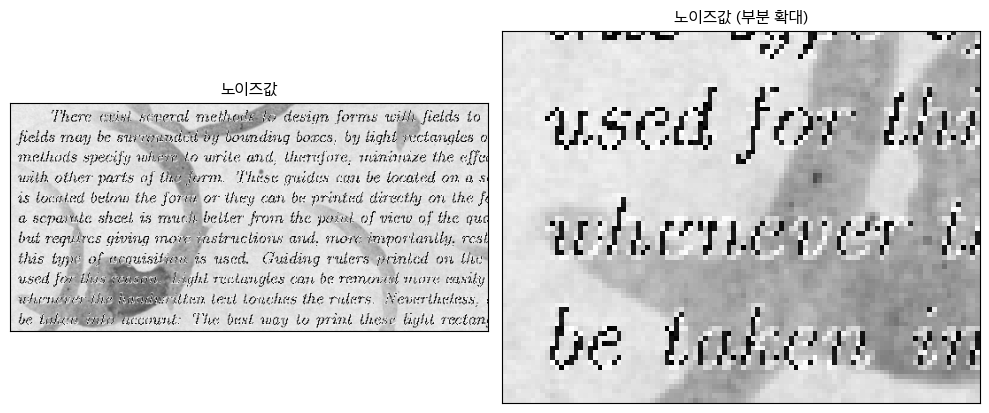

In [12]:
# 두 이미지 픽셀값의 차이(노이즈값) 시각화
noise = sample_noised - sample_cleaned
noise_zoomed = noise[180:, :100]


fig, axes = plt.subplots(1, 2, figsize=(10, 8))
remove_ticks()

axes[0].imshow(noise, cmap="gray")
axes[1].imshow(noise_zoomed, cmap="gray")

axes[0].set_title("노이즈값")
axes[1].set_title("노이즈값 (부분 확대)")

plt.tight_layout()
plt.show()

위의 결론에서는 글자 위에도 회색 노이즈를 덧입히는 과정에서 글자가 일정 수준 밝아질 수 있음을 도출했다.

그러나 노이즈 값 시각화 결과, 글자 중심으로 일관적이지 않은 노이즈값이 발생하고 있음을 알 수 있다.

In [13]:
# 흰색 노이즈값 조사
err_white = (noise == 255)
err_pixel_list = torch.nonzero(err_white)

print(f"값이 255인 노이즈값 개수: {err_white.sum().item()}개")

값이 255인 노이즈값 개수: 406개


· 좌표: (13,134)
· 노이즈 이미지 픽셀 값: 92
· 깨끗한 이미지 픽셀 값: 93


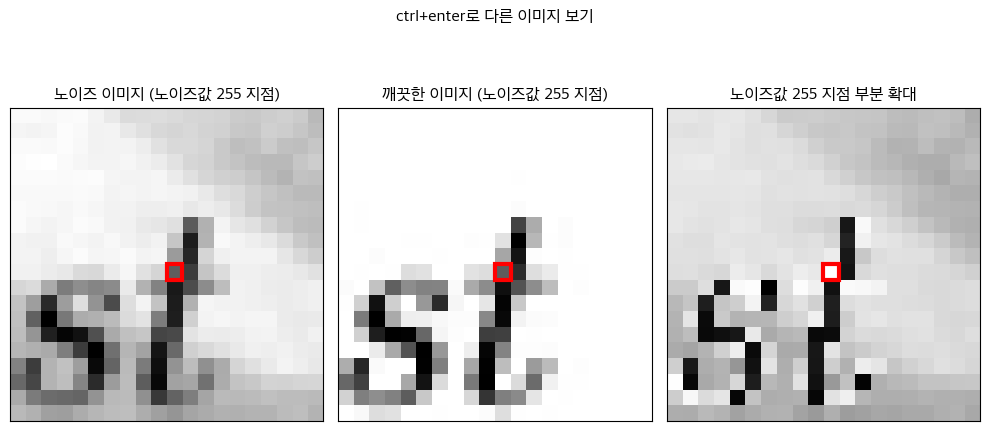

In [14]:
# 실제 확인
rand_idx = random.randint(0, len(err_pixel_list))

pix_x = err_pixel_list[rand_idx][0]
pix_y = err_pixel_list[rand_idx][1]


fig, axes = plt.subplots(1, 3, figsize=(10, 5))
remove_ticks(3)

axes[0].imshow(sample_noised[pix_x-10:pix_x+10, pix_y-10:pix_y+10], cmap="gray")
axes[1].imshow(sample_cleaned[pix_x-10:pix_x+10, pix_y-10:pix_y+10], cmap="gray")
axes[2].imshow(noise[pix_x-10:pix_x+10, pix_y-10:pix_y+10], cmap="gray")

fig.suptitle("ctrl+enter로 다른 이미지 보기")
axes[0].set_title("노이즈 이미지 (노이즈값 255 지점)")
axes[1].set_title("깨끗한 이미지 (노이즈값 255 지점)")
axes[2].set_title("노이즈값 255 지점 부분 확대")

axes[0].add_patch(patches.Rectangle((9.5, 9.5), 1, 1, edgecolor='red', fill=False, linewidth=3))
axes[1].add_patch(patches.Rectangle((9.5, 9.5), 1, 1, edgecolor='red', fill=False, linewidth=3))
axes[2].add_patch(patches.Rectangle((9.5, 9.5), 1, 1, edgecolor='red', fill=False, linewidth=3))


print(f"· 좌표: ({pix_x},{pix_y})")
print(f"· 노이즈 이미지 픽셀 값: {sample_noised[pix_x, pix_y]}")
print(f"· 깨끗한 이미지 픽셀 값: {sample_cleaned[pix_x, pix_y]}")

plt.tight_layout()
plt.show()


255라는 노이즈값은 노이즈 이미지의 값이 깨끗한 이미지 값보다 1 작을 때 발생한다.

즉, 노이즈의 값이 -1인 상황이므로 오류라고 보기는 어렵다.

이는 0부터 255까지의 숫자를 순환하는 uint8 형식에서 기인한 것으로 보인다.

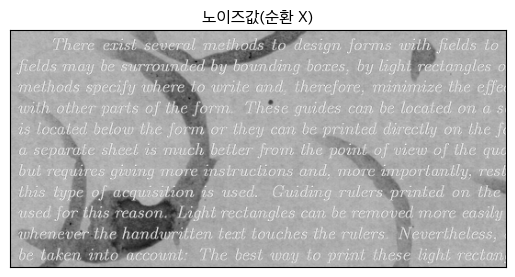

In [15]:
# 순환되지 않도록 실수형으로 계산 후 정규화
noise_float = sample_noised.float() - sample_cleaned.float() 
noise_norm = ((noise_float - noise_float.min()) / (noise_float.max() - noise_float.min())) * 255

plt.imshow(noise_norm, cmap="gray")
plt.xticks([]), plt.yticks([])
plt.title("노이즈값(순환 X)")
plt.show()

순환하지 않도록 실수형으로 처리하면 보다 자연스러운 결과물이 생성된다.

결론적으로, 검은 글자에 추가적으로 

이를 이용해 데이터를 전처리하면 보다 성능이 우수한 모델이 나올 것이라는 가설을 세울 수 있다.

## 2. 모델 구성

1. 깊이별 성능을 비교한다.

2. 수행횟수별 성능을 비교한다.

3. 패딩 유형별 성능을 비교한다.

4. 데이터 증강별 성능을 비교한다.

5. 학습률별 성능을 비교한다.

6. 유리한 각 항목을 선별하여, 보다 우수한 성능의 기존 모델을 이용하여 학습한다.

7. 오토인코더의 성능을 비교한다.

## 3. 실험 결과(코딩: 아래)

깊이 8의 수행 횟수 1의 기본적인 오토인코더가 더 깊거나 수행 횟수가 많은 오토인코더보다 좋은 성능을 보였다.

대칭 패딩, 가우시안 증강, 학습률 0.001이 유리한 것으로 나타났으나, 

이를 종합하여 학습한 모델에서 만족스러운 결과는 얻지 못했다.

색이 진한 노이즈는 지워내지 못하며, 화질 또한 뚜렷하지 않다.

작은 데이터의 크기와 더불어 기초적인 오토인코더의 구성의 한계라고 추측해보았다.

성능이 우수한 기존 모델의 오토인코더가 가지는 큰 차이점은 아래의 두 개이다.

- BatchNorm2d: 각 레이어의 입력 분포 정규화, 과적합 방지

- 512까지의 깊이: 복잡한 특징까지 계층적으로 학습

    - 실험 후 직접 모델을 설계하는 과정에서 256 깊이를 시도해보았으나, 깊이 64인 모델보다도 떨어지는 성능이 나왔다. 
    
    - 삼중으로만 구성된 모델의 성능이 더 좋을 수 있다는 점이 의아하게 다가왔다.

## 4. 결론

- 깊이, 패딩, 증강, 학습률 등의 정답은 없다는 것을 깨달을 수 있는 실험이었다.

- 데이터 유형과 과제에 따라 여러 요소를 조절할 수 있는 경험치의 중요성을 느낄 수 있었다.

- 텅 빈 결과물도 손실값의 관점에서는 줄이는 방향으로 표시되므로, 적극적인 확인 절차가 필요하다는 것을 느꼈다.


---

## 실험 과정 및 코딩

In [16]:
# 디바이스 설정
if torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps") # 맥

elif torch.cuda.is_available():
    device = torch.device("cuda:0") # 윈도우
    
else:
    device = torch.device("cpu")

### 기본 오토인코더
- 증강: 없음

- 패딩: 0(사이즈 작은 이미지는 채움)

- 학습률: 0.001

- 손실함수: MSE (0부터 1까지의 값에 효과적)

- 깊이: 8, 16, 32

### 깊이별 성능 측정

In [17]:
# 깊이별 오토인코더 생성(GPT)

import torch.nn as nn
import torch.nn.functional as F

class ByDepthAutoencoder(nn.Module):
    def __init__(self, depth):

        super().__init__()
        
        encoder_layers = []
        decoder_layers = []

        # 1. 인코더 레이어 동적 생성
        # 예: config = [1, 8, 16] -> (1, 8), (8, 16) 두 쌍에 대해 반복
        for i in range(len(depth) - 1):
            in_channels = depth[i]
            out_channels = depth[i+1]
            
            encoder_layers.extend([
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(kernel_size=2, stride=2)
            ])
            
        self.encoder = nn.Sequential(*encoder_layers)

        # 2. 디코더 레이어 동적 생성 (인코더의 역순)
        # 예: config = [1, 8, 16] -> (16, 8), (8, 1) 두 쌍에 대해 반복
        depth = depth[::-1] # [16, 8, 1]
        
        for i in range(len(depth) - 1):
            in_channels = depth[i]
            out_channels = depth[i+1]
            
            decoder_layers.extend([
                nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
            ])
            
            # 마지막 레이어(출력 채널이 1이 되는)에만 Sigmoid 적용, 나머지는 ReLU
            if i == len(depth) - 2: # 마지막 반복인 경우
                decoder_layers.append(nn.Sigmoid())
            else:
                decoder_layers.append(nn.ReLU(inplace=True))

        self.decoder = nn.Sequential(*decoder_layers)


    def forward(self, X):
        latent = self.encoder(X)
        output = self.decoder(latent)
        output = F.interpolate(output, size=(420, 540), mode='bilinear', align_corners=False)
        return output

In [18]:
# 데이터셋 설정
from torch.utils.data import Dataset

class PaperDataset(Dataset):
    size_set = set([420]) # 현 최대 사이즈 설정

    def __init__(self, get_transform):
        self.X_files = NOISED_PATHS
        self.y_files = CLEANED_PATHS
        self.get_transform = get_transform
        

    def __len__(self):
        return len(self.X_files)
    

    def __getitem__(self, index):
        X = torchvision.io.read_image(self.X_files[index])
        y = torchvision.io.read_image(self.y_files[index])

        # 패딩 사이즈 설정
        X_size = X.shape[1]
        if X_size not in PaperDataset.size_set:
            PaperDataset.size_set.add(X_size)
        max_size = max(PaperDataset.size_set)
        pad = max_size - X_size
        
        transform = self.get_transform(pad) # transform은 데이터셋 생성시 처리

        return transform(X), transform(y), pad # pad는 결과물 최종 출력시 이용

In [19]:
# 패딩 생성
from torchvision.transforms import v2

# 0 패딩(기본 패딩)
def pad_zero_trans(pad: int):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.Pad(padding=(0, 0, 0, pad), fill=0), #
        v2.ToDtype(torch.float32, scale=True)
    ])

In [20]:
import torch.optim as optim
from torch.utils.data import DataLoader, random_split

# optimizer 설정
def set_optim(model, lr=0.001):
    return optim.Adam(model.parameters(), lr=lr)


# 데이터 로더 설정
def loader(dataset: PaperDataset):
    train_size = int(0.8 * len(dataset))
    test_size = len(dataset) - train_size
    train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

    train_loader = DataLoader(train_dataset, batch_size=12, shuffle=True, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=6, shuffle=False, num_workers=0)
    
    return train_loader, test_loader


[깊이 8 모델]


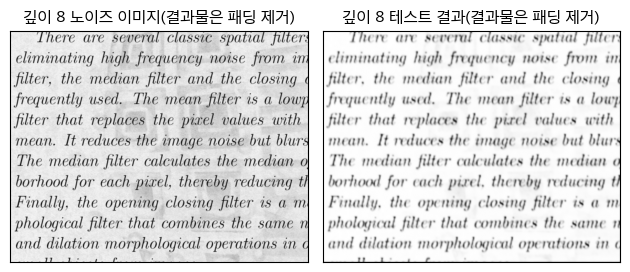

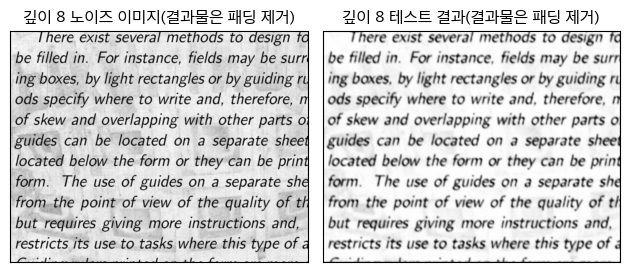

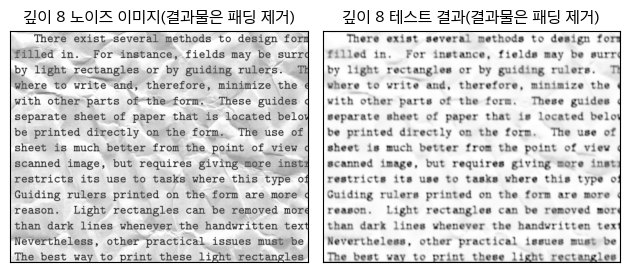

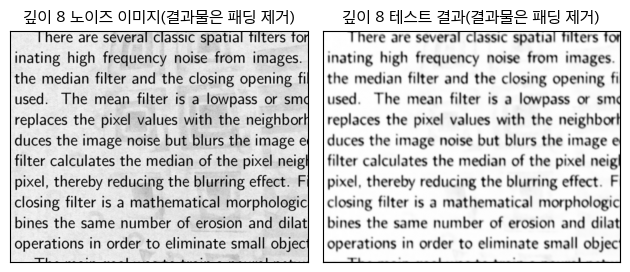

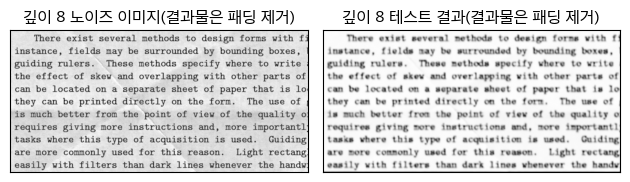

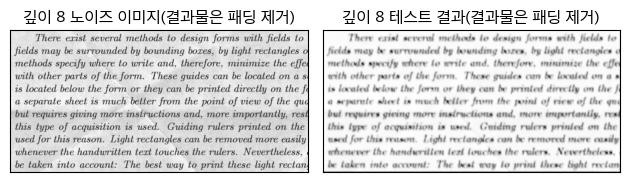


[깊이 16 모델]


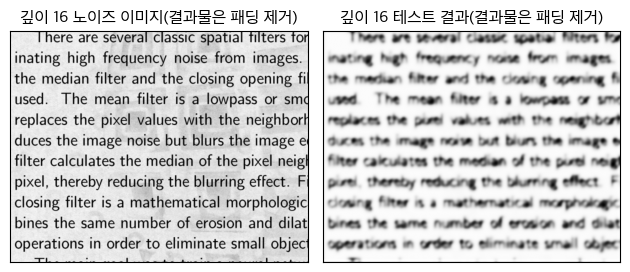

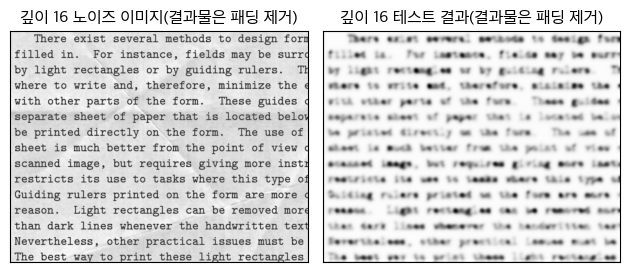

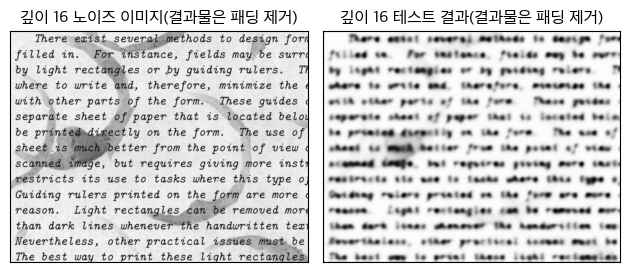

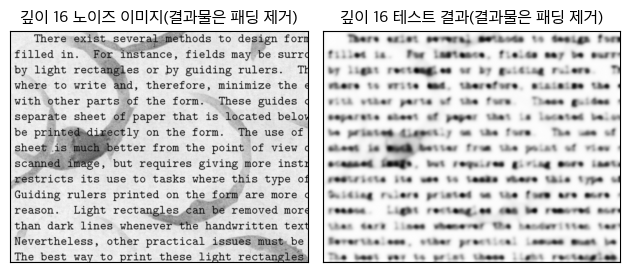

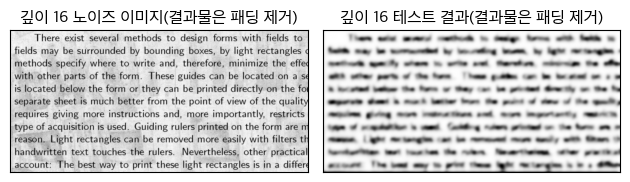

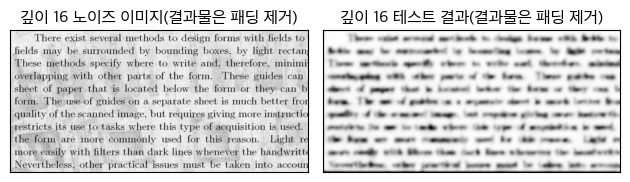


[깊이 32 모델]


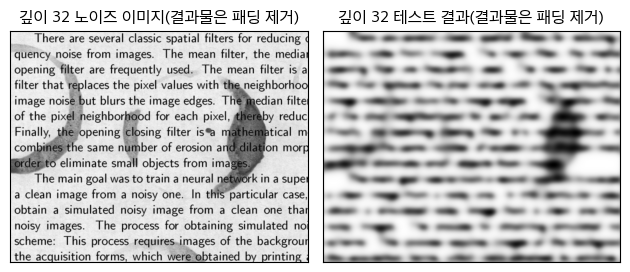

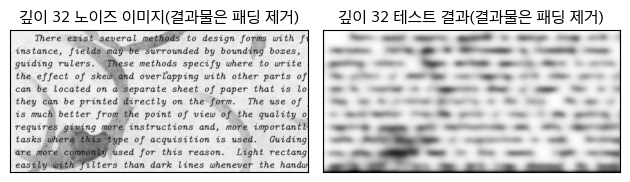

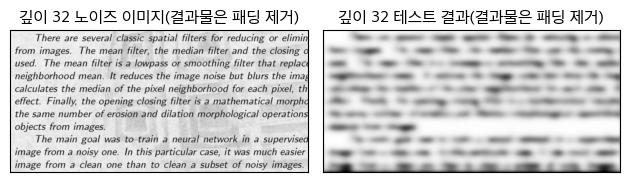

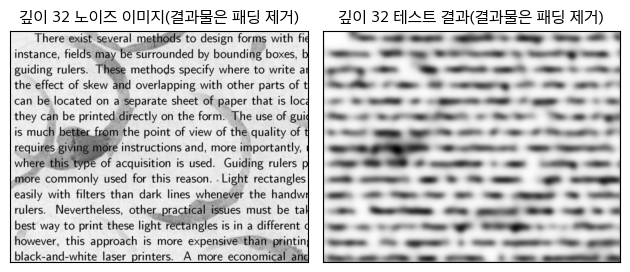

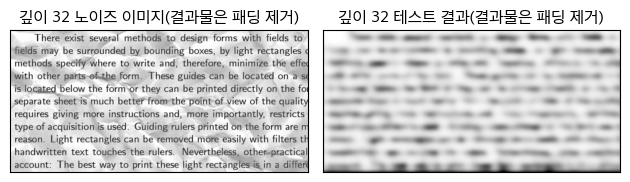

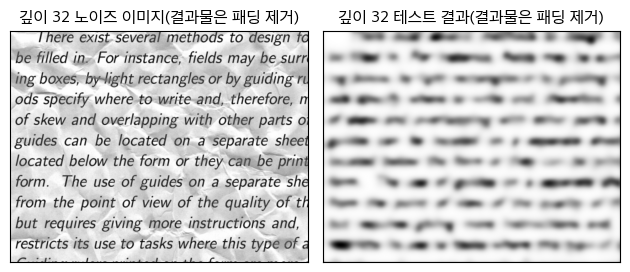

In [21]:
# 깊이별 데이터셋 생성
depth_8_dataset, depth_16_dataset, depth_32_dataset = PaperDataset(pad_zero_trans), PaperDataset(pad_zero_trans), PaperDataset(pad_zero_trans)

# 깊이별 모델 생성
depth_8_model = ByDepthAutoencoder(depth=[1, 8])
depth_16_model = ByDepthAutoencoder(depth=[1, 8, 16])
depth_32_model = ByDepthAutoencoder(depth=[1, 8, 16, 32])

# 깊이별 optimizer 생성
depth_8_optim, depth_16_optim, depth_32_optim = set_optim(depth_8_model), set_optim(depth_16_model), set_optim(depth_32_model)



# 깊이별 모델 학습 수행

dataset_dict = {"8": [depth_8_dataset, depth_8_model, depth_8_optim],
                "16": [depth_16_dataset, depth_16_model, depth_16_optim],
                "32": [depth_32_dataset, depth_32_model, depth_32_optim]
                }


for depth, set_pack in dataset_dict.items():

    criterion, dataset, model, optimizer = nn.MSELoss(), set_pack[0], set_pack[1], set_pack[2]
    model.to(device)
    train_loader, test_loader = loader(dataset)
    num_epochs = 20

    print(f"\n[깊이 {depth} 모델]")

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for X, y, _ in train_loader:

            X = X.to(device)
            y = y.to(device)
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            

    # 테스트
    model.eval()
    with torch.no_grad():
        for Xs, _, pads in test_loader:
            Xs = Xs.to(device)
            y_preds = model(Xs)
            pads = pads
            break


    # 테스트 결과 이미지 출력
    for i in range(Xs.size(0)):
        pad = pads[i].item()

        fig, axes = plt.subplots(1, 2)
        remove_ticks()

        axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
        axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

        axes[0].set_title(f"깊이 {depth} 노이즈 이미지(결과물은 패딩 제거)")
        axes[1].set_title(f"깊이 {depth} 테스트 결과(결과물은 패딩 제거)")

        plt.tight_layout()
        plt.show()

오히려 깊어질수록(채널 수가 많아질수록) 결과물이 흐릿한 것을 볼 수 있다.

단일 채널(흑백)이라는 점과 단순한 글자로 이루어져 있기 때문이라고 추측해보았다.

채널 수는 8로 고정하되, 수행 횟수만 늘려 다시 수행한다.


[수행 횟수 1회 모델]


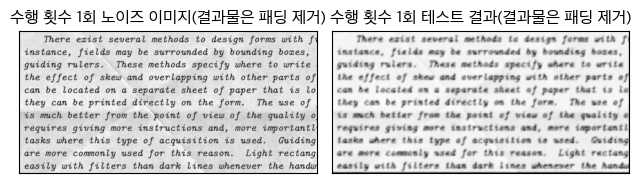

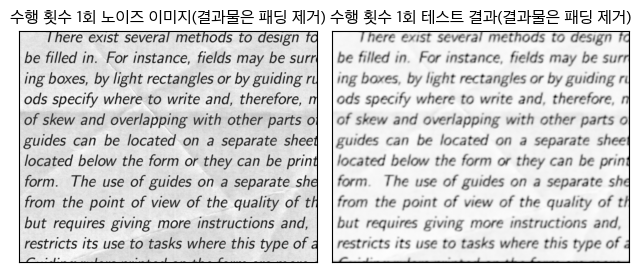

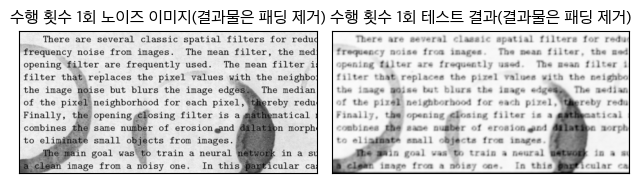

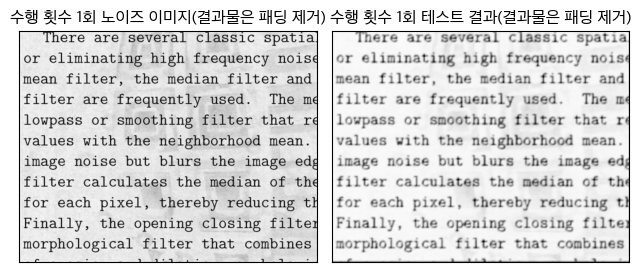

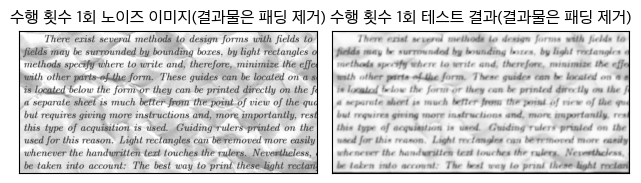

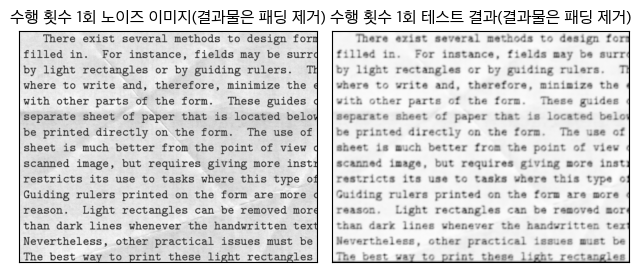


[수행 횟수 2회 모델]


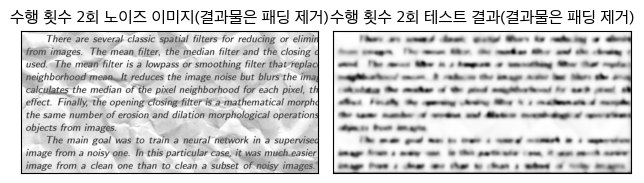

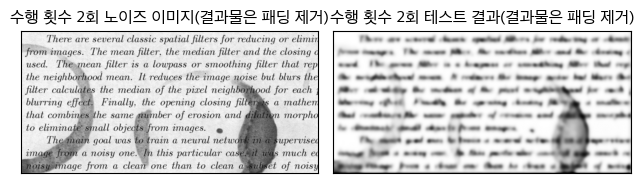

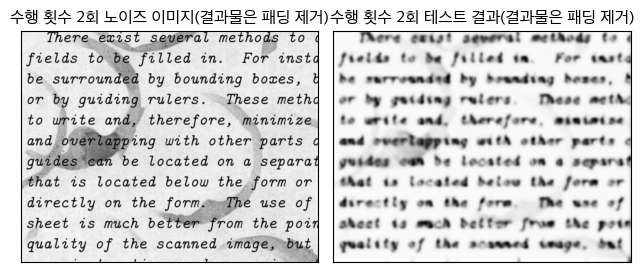

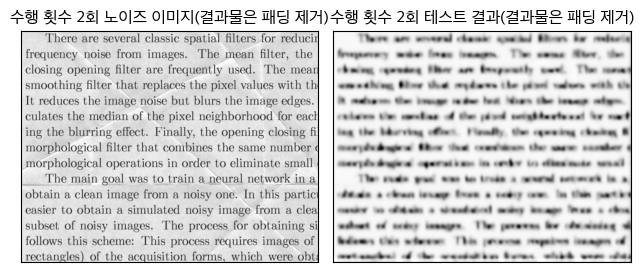

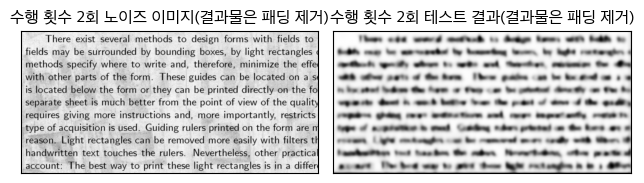

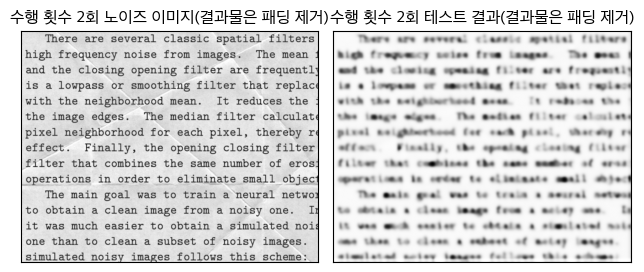


[수행 횟수 3회 모델]


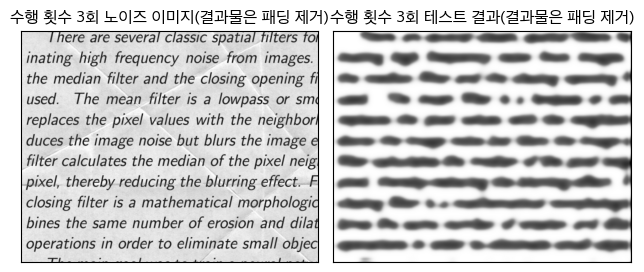

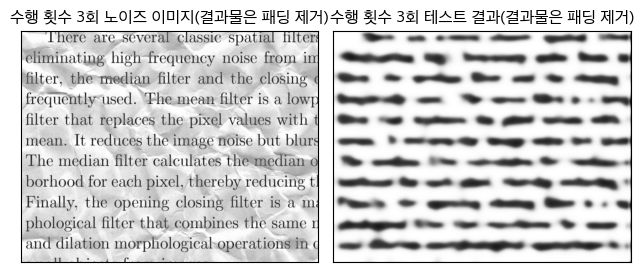

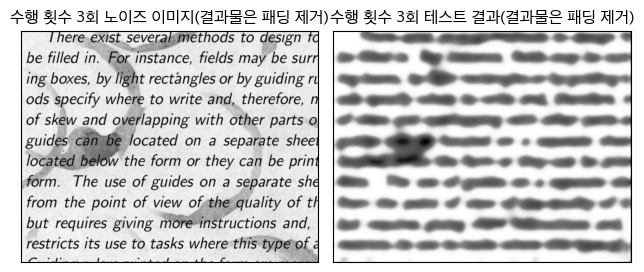

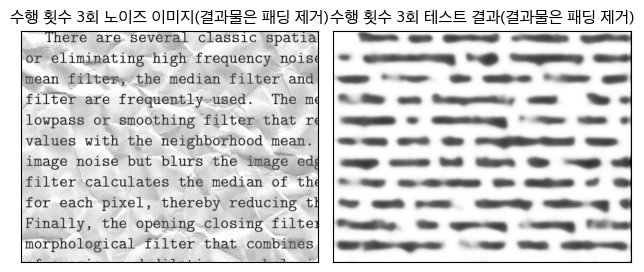

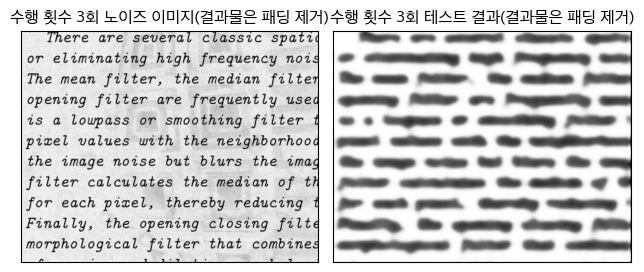

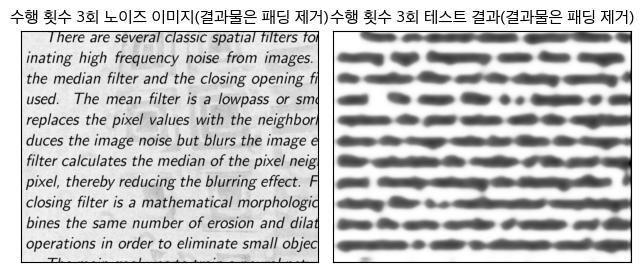

In [22]:
# 횟수별 데이터셋 생성
single_8_dataset, double_8_dataset, triple_8_dataset = PaperDataset(pad_zero_trans), PaperDataset(pad_zero_trans), PaperDataset(pad_zero_trans)

# 횟수별 모델 생성
single_8_model = ByDepthAutoencoder([1, 8])
double_8_model = ByDepthAutoencoder([1, 8, 8])
triple_8_model = ByDepthAutoencoder([1, 8, 8, 8])


# 횟수별 optimizer 생성
single_8_optim, double_8_optim, triple_8_optim = set_optim(single_8_model), set_optim(double_8_model), set_optim(triple_8_model)


# 횟수별 모델 학습 수행
dataset_dict = {"1회": [single_8_dataset, single_8_model, single_8_optim],
                "2회": [double_8_dataset, double_8_model, double_8_optim],
                "3회": [triple_8_dataset, triple_8_model, triple_8_optim]
                }


# 학습 진행
for count, set_pack in dataset_dict.items():

    criterion, dataset, model, optimizer = nn.MSELoss(), set_pack[0], set_pack[1], set_pack[2]
    model.to(device)
    train_loader, test_loader = loader(dataset)

    num_epochs = 20

    print(f"\n[수행 횟수 {count} 모델]")

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for X, y, _ in train_loader:

            X = X.to(device)
            y = y.to(device)
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
                   
            
    # 테스트
    model.eval()
    with torch.no_grad():
        for Xs, _, pads in test_loader:
            Xs = Xs.to(device)
            y_preds = model(Xs)
            pads = pads
            break


    # 테스트 결과 이미지 출력
    for i in range(Xs.size(0)):
        pad = pads[i].item()

        fig, axes = plt.subplots(1, 2)
        remove_ticks()

        axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
        axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

        axes[0].set_title(f"수행 횟수 {count} 노이즈 이미지(결과물은 패딩 제거)")
        axes[1].set_title(f"수행 횟수 {count} 테스트 결과(결과물은 패딩 제거)")

        plt.tight_layout()
        plt.show()

깊이는 동일한 상태에서 수행 횟수별로 비교한 결과도 1회가 육안으로도 가장 우수한 성능을 보여주었으므로,

앞으로의 기본 오토인코더는 깊이 8의 수행횟수 1로 설정한다.

In [23]:
class BaseAutoencoder(nn.Module):

    def __init__(self):
        super().__init__()

        # 인코더
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # 디코더
        self.decoder = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
            nn.Conv2d(8, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid(),
        )


    def forward(self, X):
        latent = self.encoder(X)
        output = self.decoder(latent)
        return output

### 패딩별 성능 측정

In [24]:
# 패딩 유형 추가

# 대칭 패딩
def pad_reflect_trans(pad: int):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.Pad(padding=(0, 0, 0, pad), padding_mode="reflect"), # 반사로 패딩
        v2.ToDtype(torch.float32, scale=True)
    ])


# 0과 대칭 혼용 패딩
def pad_hybrid_trans(pad: int):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.Pad(padding=(0, 0, 0, pad//2), padding_mode="reflect"), # 패딩 전체의 1/2을 반사로 설정
        v2.Pad(padding=(0, 0, 0, pad - pad//2), fill=0), # 나머지 1/2을 0으로 설정
        v2.ToDtype(torch.float32, scale=True)
    ])


# 패딩별 데이터셋 생성
pad_zero_dataset = PaperDataset(pad_zero_trans)
pad_reflect_dataset = PaperDataset(pad_reflect_trans)
pad_hybrid_dataset = PaperDataset(pad_hybrid_trans)

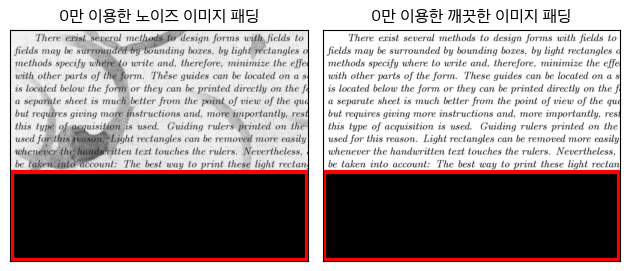

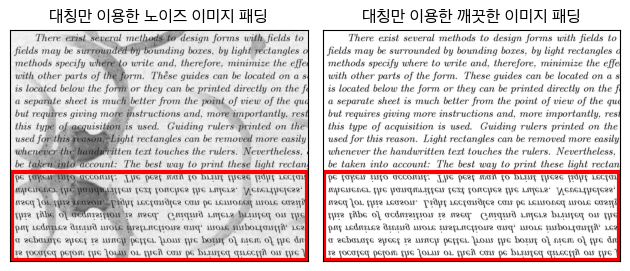

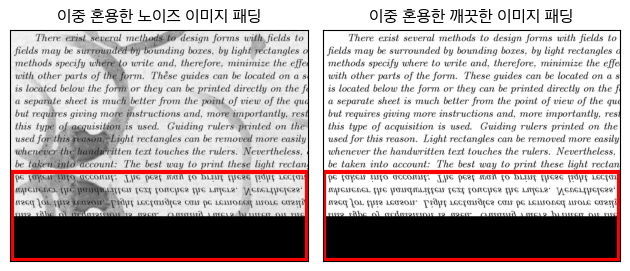

In [25]:
# 패딩 샘플 이미지 출력

tmp_dataset_dict = {"0만 이용": pad_zero_dataset, 
                "대칭만 이용": pad_reflect_dataset, 
                "이중 혼용": pad_hybrid_dataset
                }


for name, dataset in tmp_dataset_dict.items():
    pad_sample_noised, pad_sample_cleaned, _ = dataset[72]

    fig, axes = plt.subplots(1, 2)
    remove_ticks()

    axes[0].imshow(pad_sample_noised[0], cmap="gray")
    axes[1].imshow(pad_sample_cleaned[0], cmap="gray")

    axes[0].set_title(f"{name}한 노이즈 이미지 패딩")
    axes[1].set_title(f"{name}한 깨끗한 이미지 패딩")

    axes[0].add_patch(patches.Rectangle((3, 258), 535, 159, edgecolor='red', fill=False, linewidth=3))
    axes[1].add_patch(patches.Rectangle((3, 258), 535, 159, edgecolor='red', fill=False, linewidth=3))

    plt.tight_layout()
    plt.show()


[0 패딩 모델]
   패딩  증강    학습률  에포크       손실값
0   0  없음  0.001    1  0.215579
1   0  없음  0.001    2  0.191374
2   0  없음  0.001    3  0.164374
3   0  없음  0.001    4  0.139169
4   0  없음  0.001    5  0.114947
5   0  없음  0.001    6  0.100716
6   0  없음  0.001    7  0.093878
7   0  없음  0.001    8  0.089138
8   0  없음  0.001    9  0.083853
9   0  없음  0.001   10  0.079836
10  0  없음  0.001   11  0.074294
11  0  없음  0.001   12  0.068404
12  0  없음  0.001   13  0.062490
13  0  없음  0.001   14  0.056641
14  0  없음  0.001   15  0.051191
15  0  없음  0.001   16  0.046555
16  0  없음  0.001   17  0.042530
17  0  없음  0.001   18  0.039505
18  0  없음  0.001   19  0.036816
19  0  없음  0.001   20  0.034821


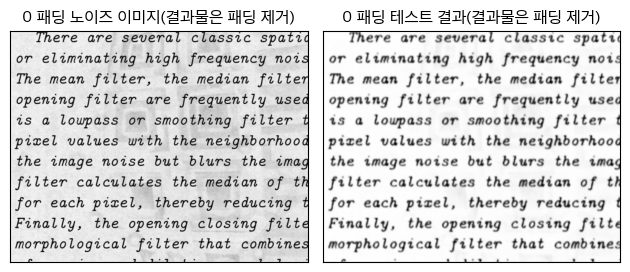

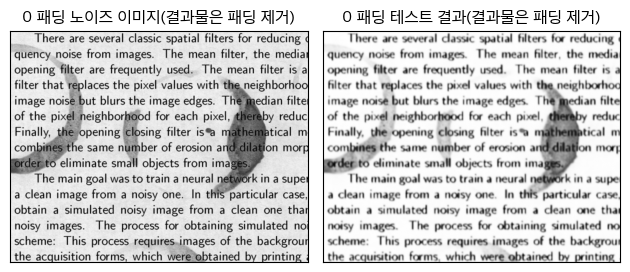

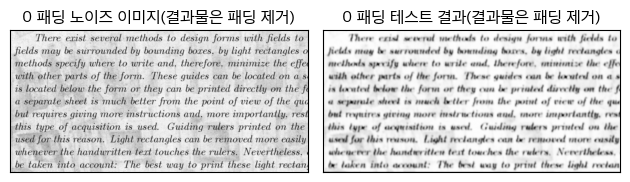

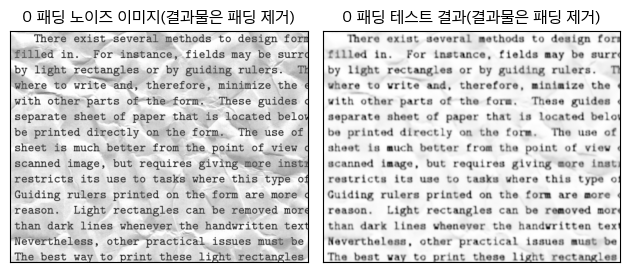

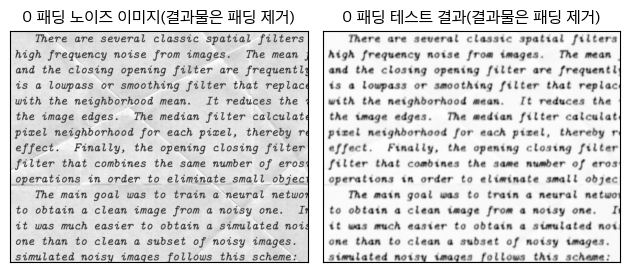

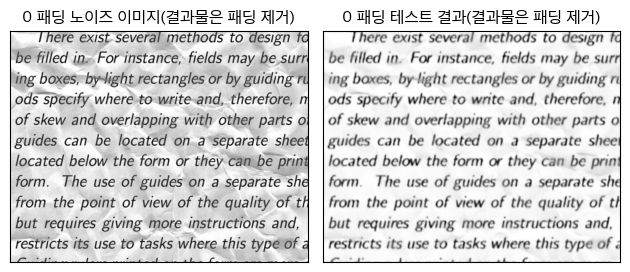


[대칭 패딩 모델]
    패딩  증강    학습률  에포크       손실값
20  대칭  없음  0.001    1  0.209426
21  대칭  없음  0.001    2  0.178553
22  대칭  없음  0.001    3  0.150383
23  대칭  없음  0.001    4  0.123053
24  대칭  없음  0.001    5  0.096780
25  대칭  없음  0.001    6  0.076138
26  대칭  없음  0.001    7  0.065705
27  대칭  없음  0.001    8  0.061492
28  대칭  없음  0.001    9  0.059930
29  대칭  없음  0.001   10  0.058841
30  대칭  없음  0.001   11  0.057401
31  대칭  없음  0.001   12  0.055597
32  대칭  없음  0.001   13  0.053579
33  대칭  없음  0.001   14  0.051573
34  대칭  없음  0.001   15  0.049817
35  대칭  없음  0.001   16  0.047830
36  대칭  없음  0.001   17  0.045841
37  대칭  없음  0.001   18  0.044250
38  대칭  없음  0.001   19  0.042395
39  대칭  없음  0.001   20  0.040837


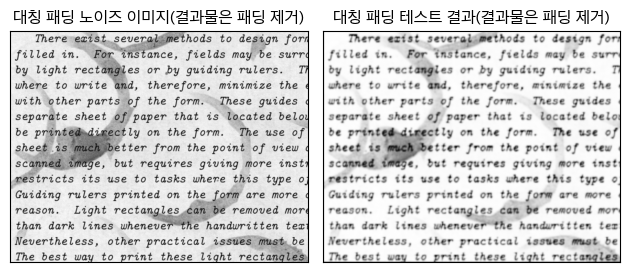

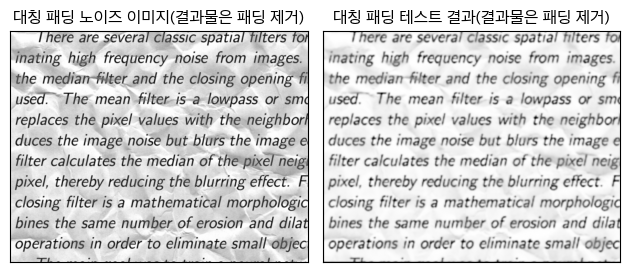

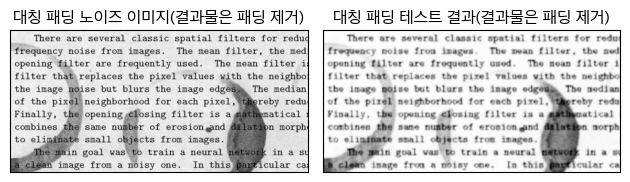

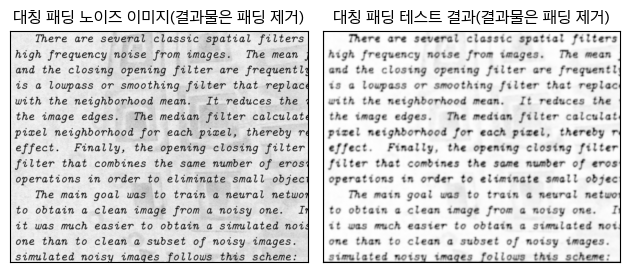

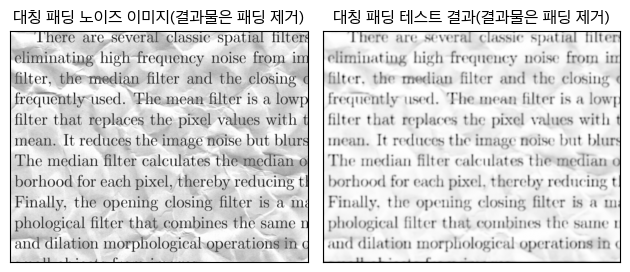

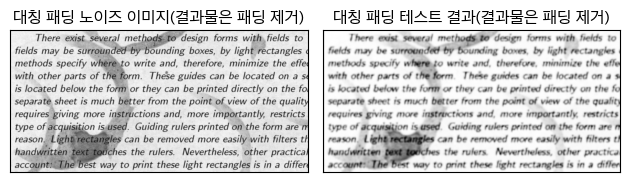


[혼용 패딩 모델]
    패딩  증강    학습률  에포크       손실값
40  혼용  없음  0.001    1  0.244850
41  혼용  없음  0.001    2  0.220079
42  혼용  없음  0.001    3  0.193222
43  혼용  없음  0.001    4  0.159335
44  혼용  없음  0.001    5  0.125459
45  혼용  없음  0.001    6  0.100878
46  혼용  없음  0.001    7  0.090041
47  혼용  없음  0.001    8  0.086909
48  혼용  없음  0.001    9  0.084704
49  혼용  없음  0.001   10  0.084378
50  혼용  없음  0.001   11  0.083578
51  혼용  없음  0.001   12  0.082534
52  혼용  없음  0.001   13  0.080130
53  혼용  없음  0.001   14  0.079937
54  혼용  없음  0.001   15  0.078722
55  혼용  없음  0.001   16  0.076771
56  혼용  없음  0.001   17  0.073811
57  혼용  없음  0.001   18  0.071833
58  혼용  없음  0.001   19  0.068720
59  혼용  없음  0.001   20  0.066498


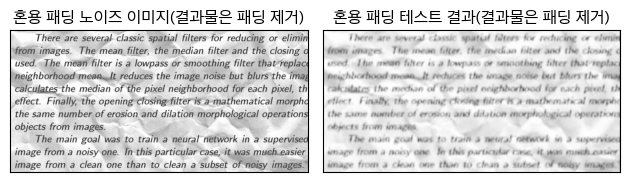

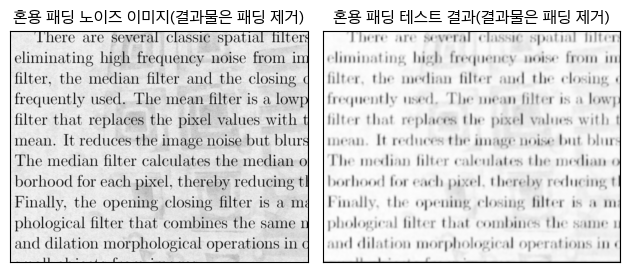

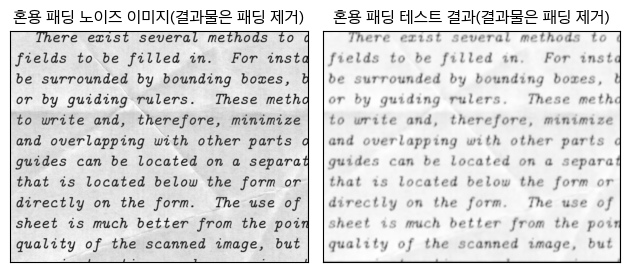

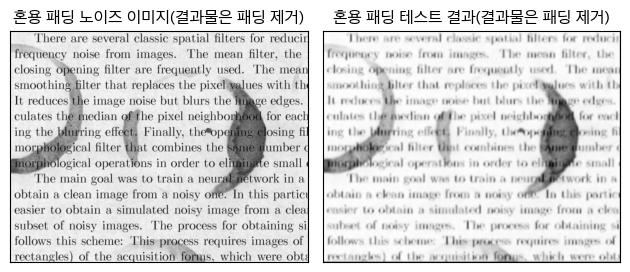

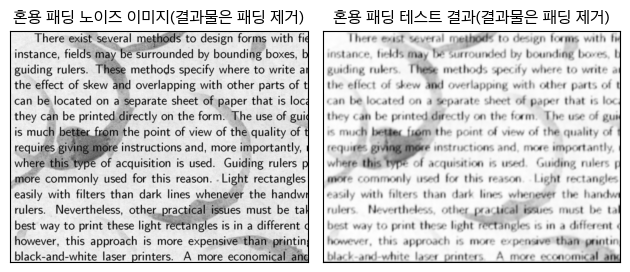

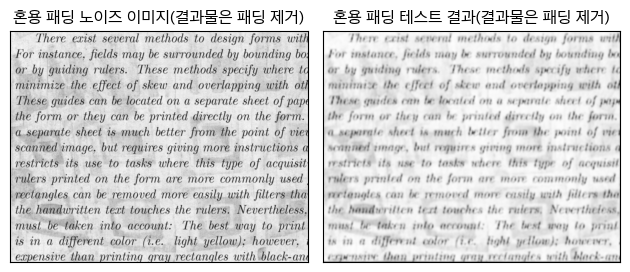

In [26]:
# 결과 대조용 데이터프레임 생성
import pandas as pd

result_df = pd.DataFrame(columns=["패딩", "증강", "학습률", "에포크", "손실값"])



# 패딩별 모델 생성
pad_zero_model, pad_reflect_model, pad_hybrid_model = BaseAutoencoder(), BaseAutoencoder(), BaseAutoencoder()

# 패딩별 optimizer 생성
pad_zero_optim, pad_reflect_optim, pad_hybrid_optim = set_optim(pad_zero_model), set_optim(pad_reflect_model), set_optim(pad_hybrid_model)


# 패딩별 모델 학습 수행
dataset_dict = {"0": [pad_zero_dataset, pad_zero_model, pad_zero_optim],
                "대칭": [pad_reflect_dataset, pad_reflect_model, pad_reflect_optim],
                "혼용": [pad_hybrid_dataset, pad_hybrid_model, pad_hybrid_optim]
                }


for padding_name, set_pack in dataset_dict.items():

    criterion, dataset, model, optimizer = nn.MSELoss(), set_pack[0], set_pack[1], set_pack[2]
    model.to(device)
    train_loader, test_loader = loader(dataset)

    num_epochs = 20

    print(f"\n[{padding_name} 패딩 모델]")
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for X, y, _ in train_loader:

            X = X.to(device)
            y = y.to(device)
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            

        result_df.loc[len(result_df)] = [padding_name, "없음", 0.001, epoch+1, total_loss/len(train_loader)]
    
    print(result_df[result_df["패딩"] == padding_name])

    # 테스트
    model.eval()
    with torch.no_grad():
        for Xs, _, pads in test_loader:
            Xs = Xs.to(device)
            y_preds = model(Xs)
            pads = pads
            break


    # 테스트 결과 이미지 출력
    for i in range(Xs.size(0)):
        pad = pads[i].item()

        fig, axes = plt.subplots(1, 2)
        remove_ticks()

        axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
        axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

        axes[0].set_title(f"{padding_name} 패딩 노이즈 이미지(결과물은 패딩 제거)")
        axes[1].set_title(f"{padding_name} 패딩 테스트 결과(결과물은 패딩 제거)")

        plt.tight_layout()
        plt.show()

대칭만을 이용한 패딩이 글자의 선명도 측면에서 가장 우수하다.

### 데이터 증강별 성능 측정

In [27]:
# 여러 형태의 증강 생성

# 밝기, 대비 변화
def aug_jitter_trans(pad):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.ToDtype(torch.float32, scale=True),
        v2.Pad(padding=(0, 0, 0, pad), fill=0),
        v2.ColorJitter(brightness=0.2, contrast=0.2) # 밝기, 대비 변화
    ])


# 가우시안 블러
def aug_gaussian_trans(pad: int):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.ToDtype(torch.float32, scale=True),
        v2.Pad(padding=(0, 0, 0, pad), fill=0),
        v2.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)) # 가우시안 블러
    ])


# 혼합
def aug_hybrid_trans(pad: int):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.ToDtype(torch.float32, scale=True),
        v2.Pad(padding=(0, 0, 0, pad), fill=0),
        v2.ColorJitter(brightness=0.2, contrast=0.2), # 밝기, 대비
        v2.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)) # 가우시안 블러
    ])

In [28]:
# 증강별 데이터셋, 모델 생성
aug_jitter_dataset, aug_jitter_model = PaperDataset(aug_jitter_trans), BaseAutoencoder()
aug_gaussian_dataset, aug_gaussian_model = PaperDataset(aug_gaussian_trans), BaseAutoencoder()
aug_hybrid_dataset, aug_hybrid_model = PaperDataset(aug_hybrid_trans), BaseAutoencoder()

# 증강별 optimizer 생성
aug_jitter_optim, aug_gaussian_optim, aug_hybrid_optim = set_optim(aug_jitter_model), set_optim(aug_gaussian_model), set_optim(aug_hybrid_model)


[밝기/대비 증강 모델]
   패딩     증강    학습률  에포크       손실값
60  0  밝기/대비  0.001    1  0.202162
61  0  밝기/대비  0.001    2  0.185178
62  0  밝기/대비  0.001    3  0.178085
63  0  밝기/대비  0.001    4  0.173819
64  0  밝기/대비  0.001    5  0.151683
65  0  밝기/대비  0.001    6  0.124800
66  0  밝기/대비  0.001    7  0.099836
67  0  밝기/대비  0.001    8  0.083725
68  0  밝기/대비  0.001    9  0.069184
69  0  밝기/대비  0.001   10  0.061830
70  0  밝기/대비  0.001   11  0.054427
71  0  밝기/대비  0.001   12  0.049391
72  0  밝기/대비  0.001   13  0.047358
73  0  밝기/대비  0.001   14  0.044183
74  0  밝기/대비  0.001   15  0.041503
75  0  밝기/대비  0.001   16  0.040158
76  0  밝기/대비  0.001   17  0.039719
77  0  밝기/대비  0.001   18  0.035621
78  0  밝기/대비  0.001   19  0.036002
79  0  밝기/대비  0.001   20  0.035685


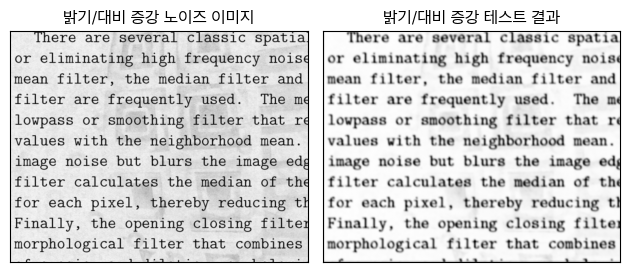

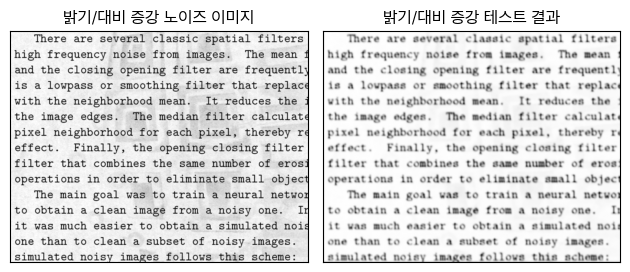

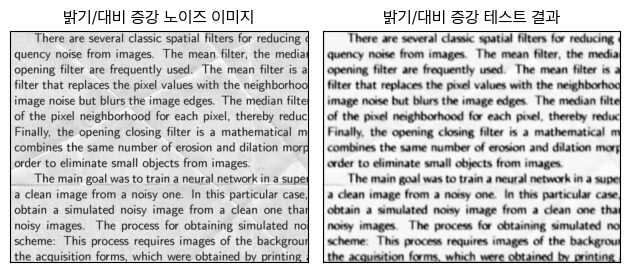

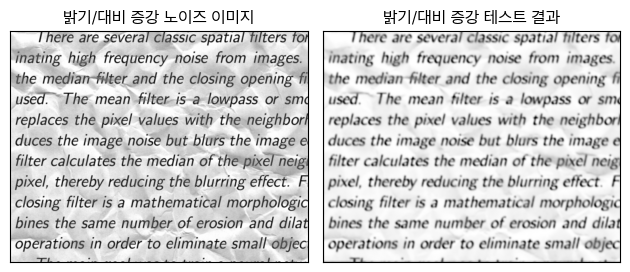

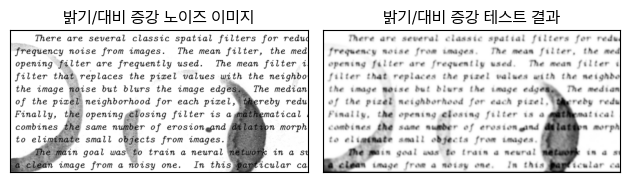

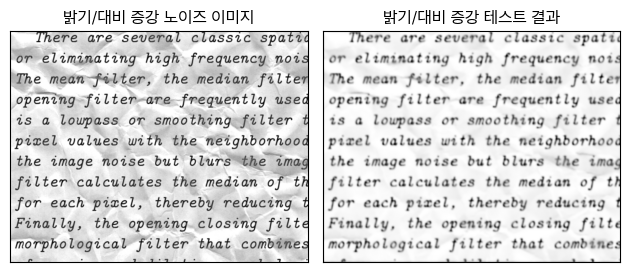


[가우시안 증강 모델]
   패딩    증강    학습률  에포크       손실값
80  0  가우시안  0.001    1  0.155985
81  0  가우시안  0.001    2  0.123355
82  0  가우시안  0.001    3  0.099073
83  0  가우시안  0.001    4  0.082744
84  0  가우시안  0.001    5  0.076457
85  0  가우시안  0.001    6  0.072658
86  0  가우시안  0.001    7  0.068929
87  0  가우시안  0.001    8  0.066437
88  0  가우시안  0.001    9  0.064895
89  0  가우시안  0.001   10  0.062529
90  0  가우시안  0.001   11  0.061186
91  0  가우시안  0.001   12  0.059776
92  0  가우시안  0.001   13  0.056859
93  0  가우시안  0.001   14  0.056853
94  0  가우시안  0.001   15  0.052887
95  0  가우시안  0.001   16  0.050372
96  0  가우시안  0.001   17  0.048452
97  0  가우시안  0.001   18  0.046299
98  0  가우시안  0.001   19  0.045008
99  0  가우시안  0.001   20  0.044348


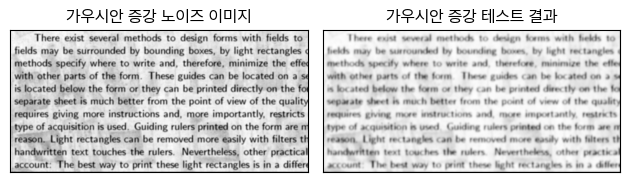

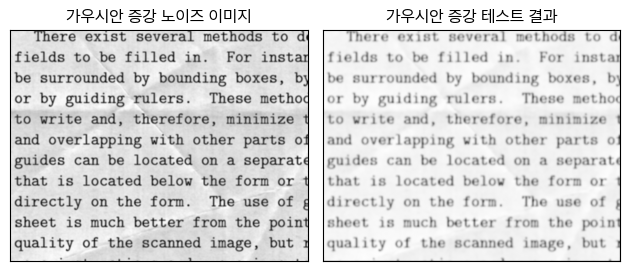

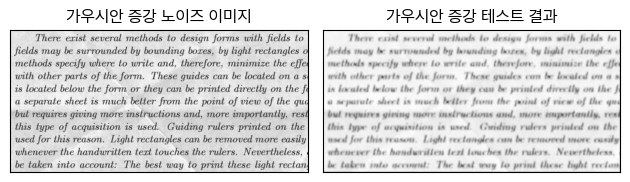

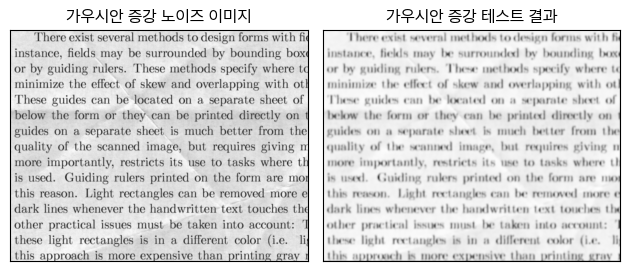

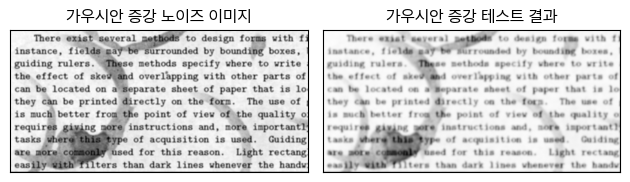

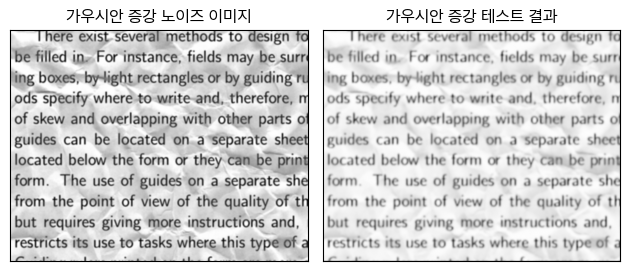


[혼용 증강 모델]
    패딩  증강    학습률  에포크       손실값
100  0  혼용  0.001    1  0.162458
101  0  혼용  0.001    2  0.143034
102  0  혼용  0.001    3  0.121245
103  0  혼용  0.001    4  0.108604
104  0  혼용  0.001    5  0.091693
105  0  혼용  0.001    6  0.074589
106  0  혼용  0.001    7  0.066255
107  0  혼용  0.001    8  0.064101
108  0  혼용  0.001    9  0.057039
109  0  혼용  0.001   10  0.053124
110  0  혼용  0.001   11  0.051438
111  0  혼용  0.001   12  0.047075
112  0  혼용  0.001   13  0.044301
113  0  혼용  0.001   14  0.042236
114  0  혼용  0.001   15  0.039982
115  0  혼용  0.001   16  0.033541
116  0  혼용  0.001   17  0.033605
117  0  혼용  0.001   18  0.030368
118  0  혼용  0.001   19  0.029031
119  0  혼용  0.001   20  0.028642


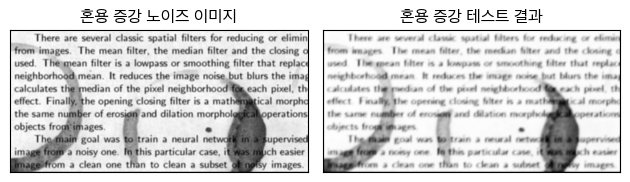

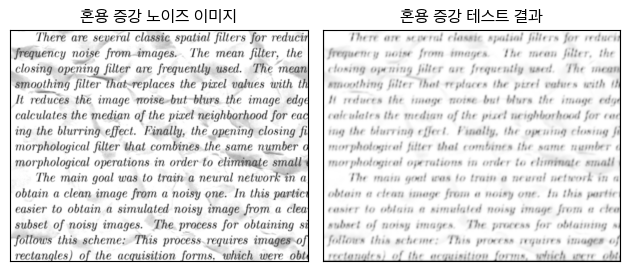

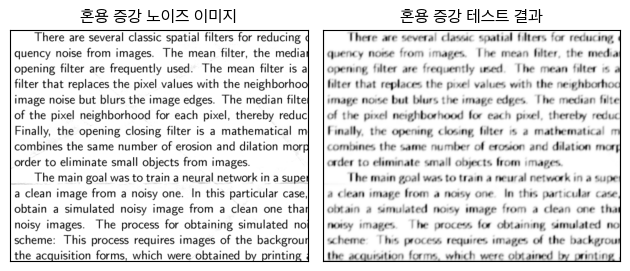

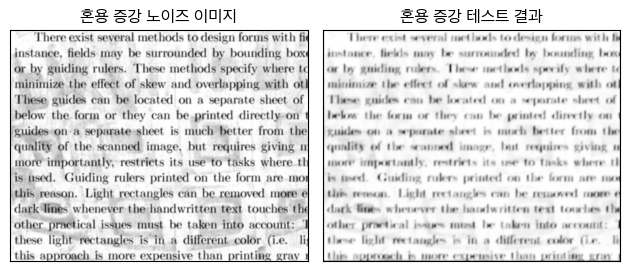

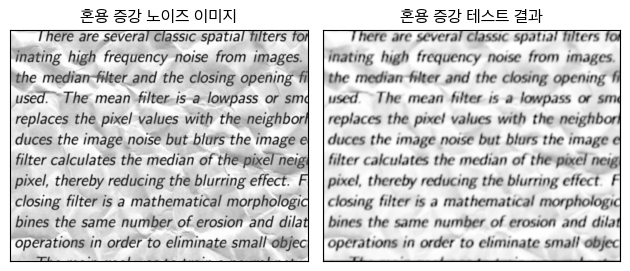

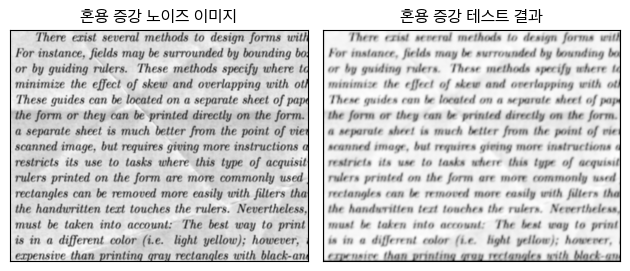

In [29]:
dataset_dict = {"밝기/대비": [aug_jitter_dataset, aug_jitter_model, aug_jitter_optim],
                "가우시안": [aug_gaussian_dataset, aug_gaussian_model, aug_gaussian_optim],
                "혼용": [aug_hybrid_dataset, aug_hybrid_model, aug_hybrid_optim]
                }


# 증강별 모델 학습 수행
for aug_name, set_pack in dataset_dict.items():

    criterion, dataset, model, optimizer = nn.MSELoss(), set_pack[0], set_pack[1], set_pack[2]
    model.to(device)
    train_loader, test_loader = loader(dataset)

    num_epochs = 20

    print(f"\n[{aug_name} 증강 모델]")
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for X, y, _ in train_loader:

            X = X.to(device)
            y = y.to(device)
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            

        result_df.loc[len(result_df)] = ["0", aug_name, 0.001, epoch+1, total_loss/len(train_loader)]
    
    print(result_df[result_df["증강"] == aug_name])


    # 모델 평가
    model.eval()
    with torch.no_grad():
        for Xs, _, pads in test_loader:
            Xs = Xs.to(device)
            y_preds = model(Xs)
            pads = pads
            break


    # 테스트 결과 이미지 출력
    for i in range(Xs.size(0)):
        pad = pads[i].item()

        fig, axes = plt.subplots(1, 2)
        remove_ticks()

        axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
        axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

        axes[0].set_title(f"{aug_name} 증강 노이즈 이미지")
        axes[1].set_title(f"{aug_name} 증강 테스트 결과")

        plt.tight_layout()
        plt.show()

밝기/대비를 이용한 증강이 가장 우수하다고 판단된다.

### 학습률별 성능 측정

In [30]:
# 학습률별 데이터셋, 모델 생성
lr_0005_dataset, lr_0005_model = PaperDataset(pad_zero_trans), BaseAutoencoder()
lr_001_dataset, lr_001_model = PaperDataset(pad_zero_trans), BaseAutoencoder()

# 학습률별 optimizer 생성
lr_0005_optim, lr_001_optim = set_optim(lr_0005_model, 0.0005), set_optim(lr_001_model)


[0.0005 학습률 모델]
    패딩  증강     학습률  에포크       손실값
120  0  없음  0.0005    1  0.245362
121  0  없음  0.0005    2  0.215755
122  0  없음  0.0005    3  0.189532
123  0  없음  0.0005    4  0.164227
124  0  없음  0.0005    5  0.142571
125  0  없음  0.0005    6  0.125712
126  0  없음  0.0005    7  0.113286
127  0  없음  0.0005    8  0.105210
128  0  없음  0.0005    9  0.099845
129  0  없음  0.0005   10  0.097371
130  0  없음  0.0005   11  0.094305
131  0  없음  0.0005   12  0.093066
132  0  없음  0.0005   13  0.091578
133  0  없음  0.0005   14  0.091628
134  0  없음  0.0005   15  0.090892
135  0  없음  0.0005   16  0.090236
136  0  없음  0.0005   17  0.089474
137  0  없음  0.0005   18  0.087864
138  0  없음  0.0005   19  0.087614
139  0  없음  0.0005   20  0.086817


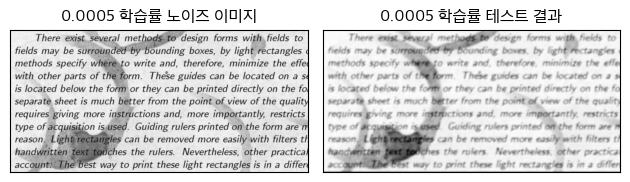

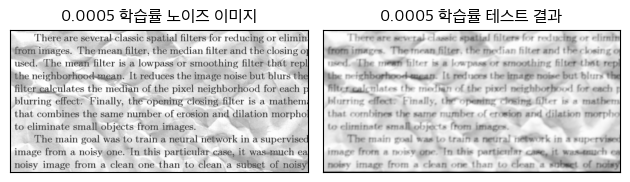

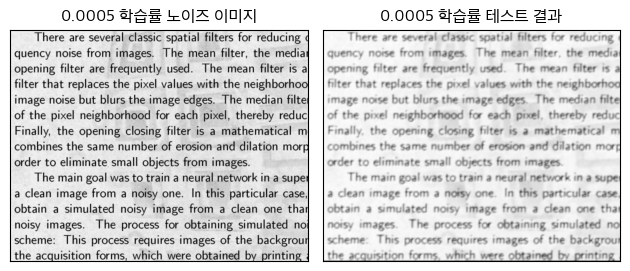

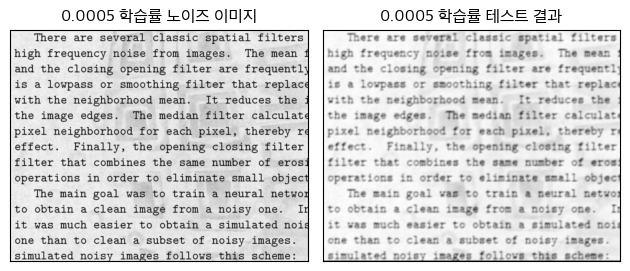

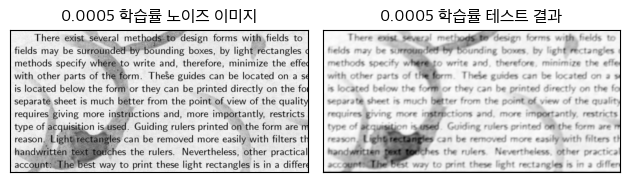

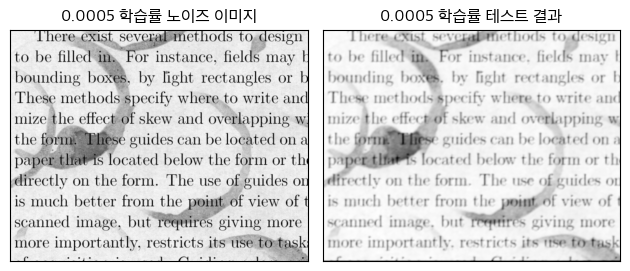


[0.001 학습률 모델]
    패딩  증강    학습률  에포크       손실값
140  0  없음  0.001    1  0.230934
141  0  없음  0.001    2  0.209768
142  0  없음  0.001    3  0.188545
143  0  없음  0.001    4  0.166163
144  0  없음  0.001    5  0.144269
145  0  없음  0.001    6  0.123711
146  0  없음  0.001    7  0.105709
147  0  없음  0.001    8  0.090602
148  0  없음  0.001    9  0.078308
149  0  없음  0.001   10  0.068611
150  0  없음  0.001   11  0.060663
151  0  없음  0.001   12  0.054646
152  0  없음  0.001   13  0.049659
153  0  없음  0.001   14  0.045507
154  0  없음  0.001   15  0.042207
155  0  없음  0.001   16  0.039608
156  0  없음  0.001   17  0.037460
157  0  없음  0.001   18  0.035443
158  0  없음  0.001   19  0.033908
159  0  없음  0.001   20  0.032640


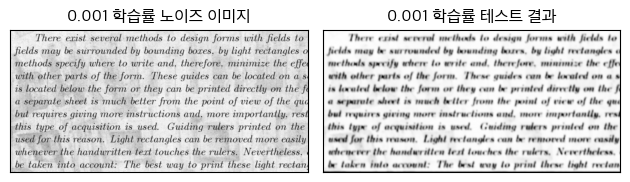

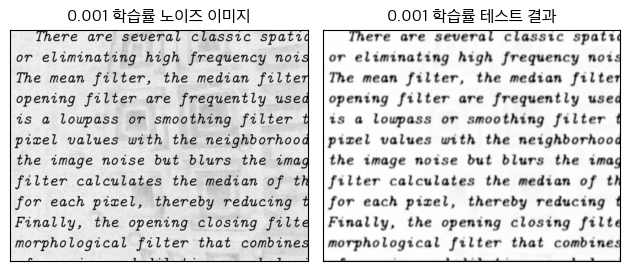

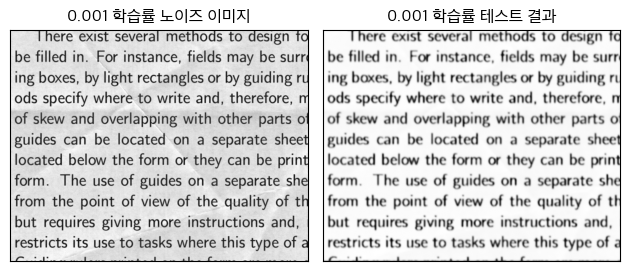

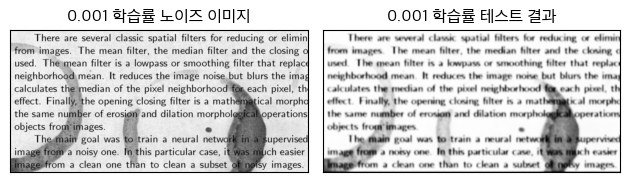

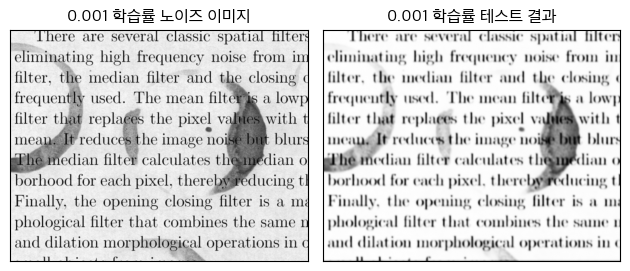

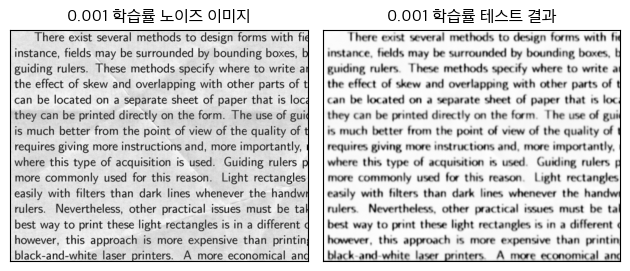

In [31]:

dataset_dict = {"0.0005": [lr_0005_dataset, lr_0005_model, lr_0005_optim],
                "0.001": [lr_001_dataset, lr_001_model, lr_001_optim]
                }


# 학습률별 모델 학습 수행
for lr_name, set_pack in dataset_dict.items():

    criterion, dataset, model, optimizer = nn.MSELoss(), set_pack[0], set_pack[1], set_pack[2]
    model.to(device)
    train_loader, test_loader = loader(dataset)

    num_epochs = 20

    print(f"\n[{lr_name} 학습률 모델]")
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for X, y, _ in train_loader:

            X = X.to(device)
            y = y.to(device)
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            
            
        result_df.loc[len(result_df)] = ["0", "없음", lr_name, epoch+1, total_loss/len(train_loader)]
    
    print(result_df[result_df["학습률"] == lr_name])


    # 모델 평가
    model.eval()
    with torch.no_grad():
        for Xs, _, pads in test_loader:
            Xs = Xs.to(device)
            y_preds = model(Xs)
            pads = pads
            break


    # 테스트 결과 이미지 출력
    for i in range(Xs.size(0)):
        pad = pads[i].item()

        fig, axes = plt.subplots(1, 2)
        remove_ticks()

        axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
        axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

        axes[0].set_title(f"{lr_name} 학습률 노이즈 이미지")
        axes[1].set_title(f"{lr_name} 학습률 테스트 결과")

        plt.tight_layout()
        plt.show()

In [32]:
result_df.loc[result_df["에포크"] == 20].sort_values("손실값")

,패딩,증강,학습률,에포크,손실값
119,0,혼용,0.001,20,0.028642
159,0,없음,0.001,20,0.032640
19,0,없음,0.001,20,0.034821
79,0,밝기/대비,0.001,20,0.035685
39,대칭,없음,0.001,20,0.040837
99,0,가우시안,0.001,20,0.044348
59,혼용,없음,0.001,20,0.066498
139,0,없음,0.0005,20,0.086817


육안 관찰과 실험 결과를 통해 얻은 결과:

- 패딩: 대칭

- 증강: 밝기/대비

- 학습률: 0.001

In [33]:
# 대칭 패딩, 가우시안 증강 transform 생성
def reflect_jitter_trans(pad: int):
    return v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.ToDtype(torch.float32, scale=True),
        v2.Pad(padding=(0, 0, 0, pad), padding_mode="reflect"), # 대칭
        v2.ColorJitter(brightness=0.2, contrast=0.2), # 밝기, 대비
    ])

# 데이터셋, 모델, optimizer 생성
reflect_jitter_dataset = PaperDataset(reflect_jitter_trans)
reflect_jitter_model = BaseAutoencoder()
reflect_jitter_optim = set_optim(reflect_jitter_model) # 학습률 0.001


[대칭 패딩/밝기·대비/0.001 모델]
     패딩    증강    학습률  에포크       손실값
160  대칭  가우시안  0.001    1  0.315535
161  대칭  가우시안  0.001    2  0.232063
162  대칭  가우시안  0.001    3  0.169949
163  대칭  가우시안  0.001    4  0.145537
164  대칭  가우시안  0.001    5  0.103708
165  대칭  가우시안  0.001    6  0.075536
166  대칭  가우시안  0.001    7  0.067912
167  대칭  가우시안  0.001    8  0.062672
168  대칭  가우시안  0.001    9  0.059127
169  대칭  가우시안  0.001   10  0.060256
170  대칭  가우시안  0.001   11  0.057512
171  대칭  가우시안  0.001   12  0.058384
172  대칭  가우시안  0.001   13  0.059330
173  대칭  가우시안  0.001   14  0.059150
174  대칭  가우시안  0.001   15  0.058435
175  대칭  가우시안  0.001   16  0.057480
176  대칭  가우시안  0.001   17  0.058659
177  대칭  가우시안  0.001   18  0.058370
178  대칭  가우시안  0.001   19  0.058141
179  대칭  가우시안  0.001   20  0.057674


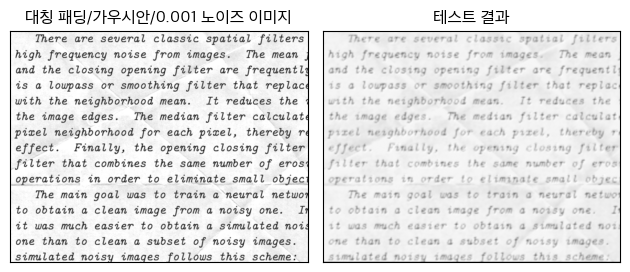

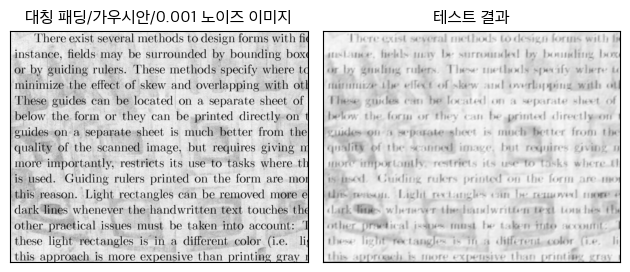

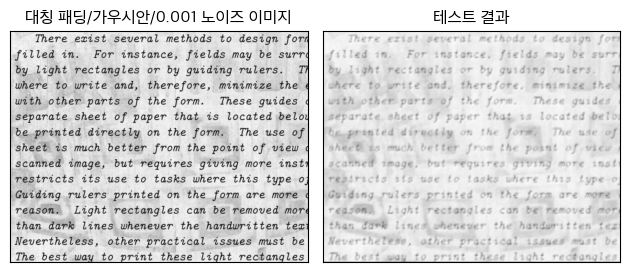

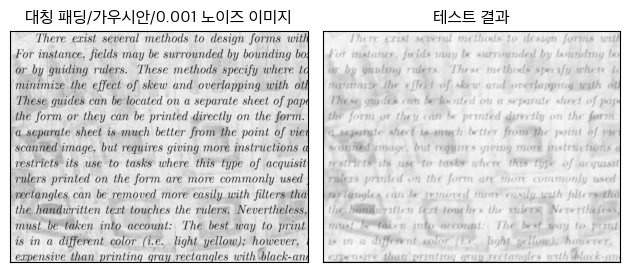

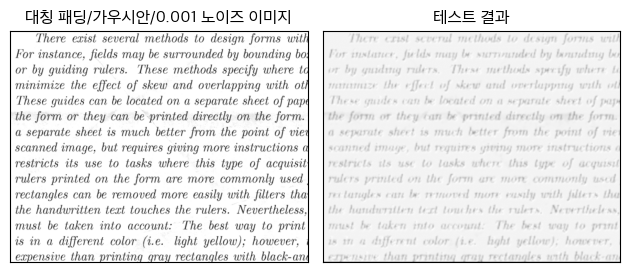

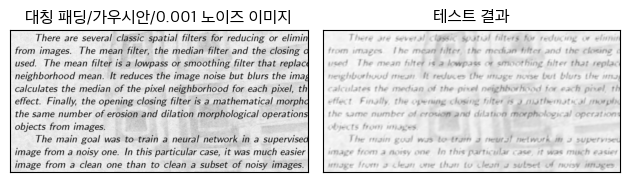

In [34]:
# 학습 수행
criterion, dataset, model, optimizer = nn.MSELoss(), reflect_jitter_dataset, reflect_jitter_model, reflect_jitter_optim
model.to(device)
train_loader, test_loader = loader(dataset)

num_epochs = 20

print(f"\n[대칭 패딩/밝기·대비/0.001 모델]")
for epoch in range(num_epochs):
    model.train()
    total_loss = 0

    for X, y, _ in train_loader:

        X = X.to(device)
        y = y.to(device)
        
        y_pred = model(X)
        
        loss = criterion(y_pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        
        
    result_df.loc[len(result_df)] = ["대칭", "가우시안", 0.001, epoch+1, total_loss/len(train_loader)]

print(result_df[(result_df["패딩"] == "대칭") & (result_df["증강"] == "가우시안")])


# 모델 평가
model.eval()
with torch.no_grad():
    for Xs, _, pads in test_loader:
        Xs = Xs.to(device)
        y_preds = model(Xs)
        pads = pads
        break


# 테스트 결과 이미지 출력
for i in range(Xs.size(0)):
    pad = pads[i].item()

    fig, axes = plt.subplots(1, 2)
    remove_ticks()

    axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
    axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

    axes[0].set_title("대칭 패딩/가우시안/0.001 노이즈 이미지")
    axes[1].set_title("테스트 결과")

    plt.tight_layout()
    plt.show()

In [35]:
result_df.loc[result_df["에포크"] == 20].sort_values("손실값").head(3)

,패딩,증강,학습률,에포크,손실값
119,0,혼용,0.001,20,0.028642
159,0,없음,0.001,20,0.032640
19,0,없음,0.001,20,0.034821


오히려 손실값 기준으로 성능이 떨어진다.

육안으로도 또한 글씨가 더욱 번지는 것을 확인할 수 있다.

### 기존 우수 모델

In [36]:
# 기존 모델

import torch.nn.functional as F

class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()

        # 인코더
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=5, stride=2, padding=4),  # 420x540 -> 210x270
            nn.ReLU(),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=3),  # 210x270 -> 105x135
            nn.ReLU(),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=2),  # 105x135 -> 53x68
            nn.ReLU(),
            nn.BatchNorm2d(256),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),  # 53x68 -> 27x34
            nn.ReLU(),
            nn.BatchNorm2d(512)
        )

        # 디코더
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),  # 27x34 -> 53x68
            nn.ReLU(),
            nn.BatchNorm2d(256),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=2, output_padding=1),  # 53x68 -> 105x135
            nn.ReLU(),
            nn.BatchNorm2d(128),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=3, output_padding=1),   # 105x135 -> 210x270
            nn.ReLU(),
            nn.BatchNorm2d(64),
            nn.ConvTranspose2d(64, 1, kernel_size=5, stride=2, padding=4, output_padding=1),     # 210x270 -> 420x540
            nn.Sigmoid()  # 픽셀 값 [0, 1]로 정규화
        )

    def forward(self, x):
        # 인코딩
        encoded = self.encoder(x)

        # 디코딩
        decoded = self.decoder(encoded)

        # 최종 크기 맞춤
        resized_output = F.interpolate(decoded, size=(420, 540), mode='bilinear', align_corners=False)
        return resized_output
    

reflect_jitter_dataset = PaperDataset(reflect_jitter_trans)
reflect_jitter_model = DenoisingAutoencoder()
reflect_jitter_optim = set_optim(reflect_jitter_model)


[기존 우수 모델]


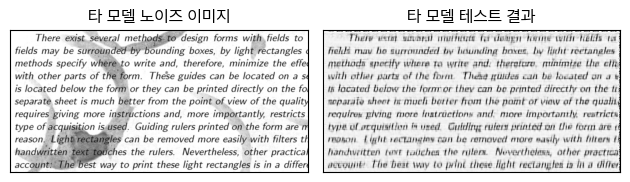

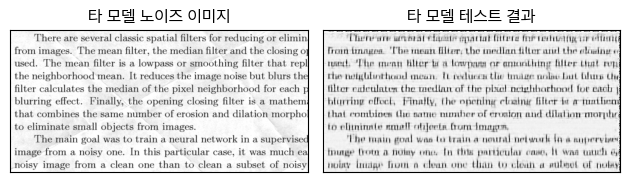

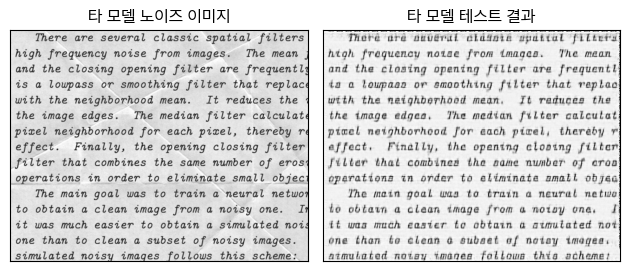

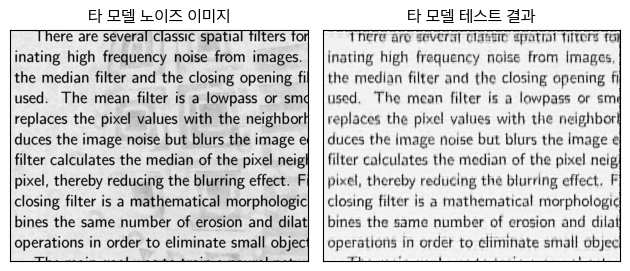

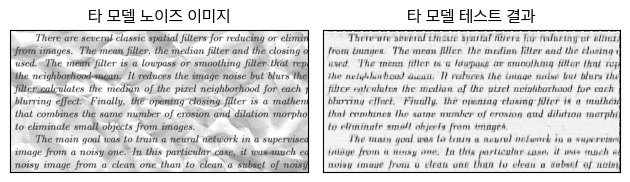

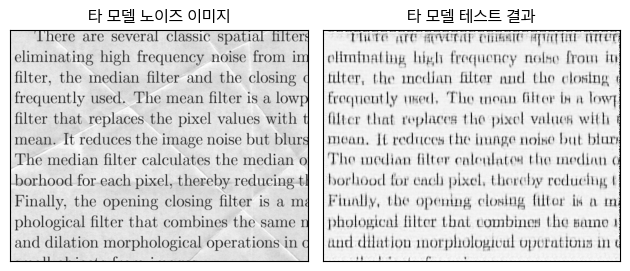

In [37]:
#학습 수행
criterion, dataset, model, optimizer = nn.MSELoss(), reflect_jitter_dataset, reflect_jitter_model, reflect_jitter_optim
model.to(device)
train_loader, test_loader = loader(dataset)

num_epochs = 20

print(f"\n[기존 우수 모델]")
for epoch in range(num_epochs):
    model.train()
    total_loss = 0

    for X, y, _ in train_loader:

        X = X.to(device)
        y = y.to(device)
        
        y_pred = model(X)
        
        loss = criterion(y_pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        

# 모델 평가
model.eval()
with torch.no_grad():
    for Xs, _, pads in test_loader:
        Xs = Xs.to(device)
        y_preds = model(Xs)
        pads = pads
        break


# 테스트 결과 이미지 출력
for i in range(Xs.size(0)):
    pad = pads[i].item()

    fig, axes = plt.subplots(1, 2)
    remove_ticks()

    axes[0].imshow(Xs[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")
    axes[1].imshow(y_preds[i][0][:-pad if pad > 0 else None, :].cpu(), cmap="gray")

    axes[0].set_title("타 모델 노이즈 이미지")
    axes[1].set_title("타 모델 테스트 결과")

    plt.tight_layout()
    plt.show()

기존 우수 모델로 학습한 결과, 노이즈는 육안으로 거의 식별이 되지 않는다.